# Práctica 3 PVC
### Natalia Martínez García y Lucía Vega Navarrete - Grupo 1.1
## Ejercicio 1 - Segmentación de carreteras en imagen área de alta resolución

In [1]:
import numpy as np
from pathlib import Path
import pandas as pd
from skimage import io
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, jaccard_score
import matplotlib.pyplot as plt
from skimage.color import rgb2hsv
from skimage.morphology import binary_opening, binary_closing, disk, remove_small_objects, remove_small_holes
from scipy.ndimage import uniform_filter
from skimage.filters import frangi, sobel, gaussian, laplace 
from skimage.feature import canny                             


In [2]:
# Fijamos la semilla para poder reproducir los resultados
import random
seed = 123
np.random.seed(seed)
random.seed(seed)

## Ejercicio 1 -  Segmentación de carreteras en imagen aérea de alta resolución

### Carga del dataset

Primero cargamos todas las imágenes de satélite y sus máscaras correspondientes desde las carpetas del dataset. Para garantizar que cada imagen está emparejada con su máscara correcta, primero listamos y ordenamos los archivos. Después, las imágenes las leemos tal cual y las máscaras se binarizan para obtener valores 0/1. Luego, lo convertimos todo en arrays de NumPy para poder procesarlo de forma eficiente en los siguientes pasos de la práctica. Por último, imprimimos las dimensiones de las imágenes para comprobar que todo se ha cargado correctamente. 

In [ ]:
# Ruta al dataset
# Lo tenemos en la misma carpeta que el notebook
dataset_path = Path("DataSet_1/roads")
sat_path = dataset_path / "sat" # Carpeta con las imagenes por satelite (inputs del modelo)
gt_path = dataset_path / "gt" # Carpeta con las carreteras marcadas (salidas esperadas)

# Cargamos las imágenes
# Las ordenamos para que cada imagen de la carpeta sat este en la misma posicion que en la carpeta gt (tienen el mismo nombre)
sat_files = sorted(sat_path.glob("*.tif*")) # Leer todas las de la carpeta a la vez
gt_files = sorted(gt_path.glob("*.tif*"))

# Listas donde almacenamos las imágenes y sus máscaras ya cargadas
images = []
masks = []

# Recorremos ambas listas en parallelo
for sat_file, gt_file in zip(sat_files, gt_files):
    # Cargar imagen RGB del satelite
    img = io.imread(sat_file)
    images.append(img)
    
    # Cargar y preparar la máscara
    mask = io.imread(gt_file) # La máscara suele venir en escala de grises con valores 0 (fondo) y 255 (carretera)
    mask = (mask > 128).astype(np.uint8) # Lo tenemos que poner convertir a binario (0 y 1) porque ahora tiene como valores 0 y 255
    masks.append(mask)
    
# Convertimos las listas a arrays numpy para poder indexarlas 
images = np.array(images)
masks = np.array(masks)

# Comprobamos las dimensiones
print(f"Shape imágenes: {images.shape}")
print(f"Shape máscaras: {masks.shape}")

Shape imágenes: (20, 1500, 1500, 3)
Shape máscaras: (20, 1500, 1500)


La salida confirma que el dataset se ha cargado correctamente: tenemos 20 imágenes y 20 máscaras, todas con un tamaño de 1500×1500 píxeles. Las imágenes son RGB (por eso tienen 3 canales) y las máscaras están en formato binario (1 canal). Esto indica que la carga funcionó como se esperaba y que los datos están listos para trabajar sobre ellos.

### División de los datos

Aquí hacemos una división aleatoria del dataset en entrenamiento, validación y test. Para ello, primero generamos una permutación aleatoria de los índices de todas las imágenes. A partir de esa lista mezclada, cogemos 2 imágenes para test, 2 para validación y el resto para entrenamiento. Después, se usan esos índices para extraer las imágenes y máscaras correspondientes, obteniendo así tres subconjuntos que vamos a utilizar para entrenar, ajustar y evaluar el método de segmentación píxel a píxel.

In [ ]:
# Dividimos aleatoriamente
n_total = len(images) 
indices = np.random.permutation(n_total) # Devuelve una secuencia desordenada de numeros del 0 a n_total - 1

# Dividimos el dataset por indices
test_indices = indices[:2] # 2 primeras para test
val_indices = indices[2:4] # 2 siguientes para val
train_indices = indices[4:] # resto para train

# Construimos cada subconjunto 
# Imágenes
X_test = images[test_indices]
X_val = images[val_indices]
X_train = images[train_indices]

# Máscaras 
y_test = masks[test_indices]
y_val = masks[val_indices]
y_train = masks[train_indices]

# Comprobamos cuántas imágenes contiene cada partición
print(f"Total: {n_total} imágenes")
print(f"Train: {len(X_train)} imágenes")
print(f"Validación: {len(X_val)} imágenes")
print(f"Test: {len(X_test)} imágenes")

Total: 20 imágenes
Train: 16 imágenes
Validación: 2 imágenes
Test: 2 imágenes


La salida muestra que la división se realizó correctamente: 16 imágenes para entrenar, 2 para validar y 2 para test. Con esta distribución, disponemos de suficientes ejemplos para entrenar un modelo básico, reservando al mismo tiempo datos diferentes a los de entrenamiento para comprobar el rendimiento y realizar distintas pruebas. Esto confirma que la partición funcionó como se esperaba y los conjuntos están listos para los siguientes pasos.

### Preprocesado + Extracción de características 

#### Preprocesado

Una vez dividido el conjunto de datos, tenemos que aplicar un preprocesado que deje las imágenes listas para trabajar a nivel de píxel. En nuestro caso, utilizamos la función `normalize_images`, que convierte las intensidades originales de 0-255 al rango 0-1 para poder usar las imágenes como entrada de los modelos de clasificación. Luego, usamos la función `flatten_data` para aplanar las imágenes y sus máscaras. 

Debido a que la mayoría de píxeles pertenecen al fondo y solo una parte pequeña corresponde a carreteras, el conjunto de datos está muy desbalanceado. Para evitar que los modelos se inclinen hacia   la clase mayoritaria, aplicamos un undersampling mediante la función `undersample`. Esta función selecciona el mismo número de píxeles de carretera y de fondo, ya sea utilizando todos los disponibles de la clase minoritaria o fijando un número máximo de píxeles por clase (`n_per_class`). Además, la selección se realiza de forma aleatoria. Usamos una semilla (`random_state`) para repetir los experimentos. 

In [ ]:
def normalize_images(images):
    """Normaliza imágenes al rango [0, 1]"""
    return images.astype(np.float32) / 255.0


def flatten_data(X, y):
    """
    Aplana el conjunto de imágenes y sus máscaras para clasificación píxel a píxel.

    - X: (N, H, W, C) -> (N*H*W, C)
    - y: (N, H, W) -> (N*H*W,)

    Así, cada píxel pasa a ser una muestra independiente con C características.
    
    """
    X_flat = X.reshape(-1, X.shape[-1]) # Aplanamos las imágenes. cada píxel se convierte en una fila con C features
    y_flat = y.reshape(-1)  # Aplanamos las máscaras para tener una etiqueta por píxel
    return X_flat, y_flat


def undersample(image, mask, n_per_class=None, random_state=None):
    """
    Realiza undersampling entre clases y permite fijar cuántos píxeles por clase se quieren usar. 
    """
    # Índices de cada clase
    road_idx = np.where(mask == 1)[0]
    bg_idx   = np.where(mask == 0)[0]

    # Generador de aleatoriedad (por si queremos repetir experimentos)
    rng = np.random.default_rng(random_state)

    if n_per_class is None: # Si no se especifica el nº de píxeles por clase 
        # Igualamos los datos de la clase mayoritaria al nº de la minoritaria
        n_road = len(road_idx) # num de datos de la minoritaria 
        bg_sampled = rng.choice(bg_idx, n_road, replace=False) # cogemos tantos péxeles de fondo como píxeles de carretera sin reemplazo (no seleccionar el mismo pixel dos veces)
    else: 
        # Fijamos el nº de píxeles por clase
        n_road = len(road_idx)
        n_bg = len(bg_idx)

        # No podemos muestrear más de los que hay
        n_pix = min(n_per_class, n_road, n_bg)

        road_sampled = rng.choice(road_idx, n_pix, replace=False)
        bg_sampled = rng.choice(bg_idx, n_pix, replace=False)

    # Mezclamos
    selected = np.concatenate([road_sampled, bg_sampled])
    rng.shuffle(selected)

    return image[selected], mask[selected]

#### Extracción de características 

Para mejorar la representación de cada píxel antes de entrenar los modelos de clasificación, añadimos una etapa de extracción de características. El objetivo es transformar la imagen original en un conjunto de características que describa información de color, textura, bordes y estructuras de cada píxel.

Incluimos las siguientes características: 

1. **Canales RGB**
    * **Qué aporta:** Intensidad básica de cada color
    * **Por qué lo usamos:** Las carreteras tienen colores típicos (asfalto gris oscuro) que las diferencia de vegetación y edificios.

2. **Canales HSV**
    * **Qué aporta:** Separación entre tono, saturación y luminosidad
    * **Por qué lo usamos:** Este espacio separa mejor color e iluminación, ayudando a ditinguir mejor zonas similares en RGB pero distintas en brillo. Permite reconocer carreteras aunque cambie la iluminación.

3. **Textura local (media con ventana deslizante)**
    * **Qué aporta:** Suavidad u homogeneidad de cada región.
    * **Por qué lo usamos:** Las carreteras son mucho más uniformes que el resto de componentes de las imágenes

4. **Textura local (desviación típica)**
    * **Qué aporta:** Variación local de intensidad 
    * **Por qué lo usamos:** Las carreteras no presentan mucha variabilidad local, mientras que el la mayoría del resto de componentes sí.

5. **Frangi (crestas claras y oscuras)**
    * **Qué aporta:** Resalta estructuras lineales y alargadas
    * **Por qué lo usamos:** Las carreteras son lineales y continuas

6. **Gradiente Sobel (magnitud del borde)** 
    * **Qué aporta:** Indica la fuerza del borde
    * **Por qué lo usamos:** Marca las transiciones entre carretera y entorno, permitiendo detectar sus límites.

7. **Orientación del gradiente**
    * **Qué aporta:** Dirección de bordes
    * **Por qué lo usamos:** Aporta información sobre la dirección local del borde, y las carreteras presentan direcciones más consistentes que el resto del entorno.

8. **DoG (Difference of Gaussians)** 
    * **Qué aporta:** Bordes a una escala media, filtrando texturas finas.
    * **Por qué lo usamos:** Permite resaltar los límites de la carretera sin verse afectado por texturas finas del terreno.

9. **LoG (Laplacian of Gaussian)**
    * **Qué aporta:** Curvaturas y cambios fuertes.
    * **Por qué lo usamos:** Complementa a otros detectores capturando curvas, uniones y zonas donde la carretera cambia de dirección o grosor.

10. **Canny** 
    * **Qué aporta:** Bordes limpios y precisos.
    * **Por qué lo usamos:** Proporciona contornos más limpios y estables que otros métodos, mejorando la detección del trazado de la carretera incluso en zonas con sombras o ruido.

Todos los mapas generados se apilan como canales adicionales para formar una lista de características por imagen y, finalmente, normalizamos cada canal de manera independiente al rango [0, 1], garantizando que los diferentes descriptores sean comparables en escala y evitando que alguno de ellos domine al resto durante el entrenamiento.

La función `extract_features` se encarga de generar este conjunto de características para una única imagen, mientras que `extract_all_features` aplica el proceso a todas las imágenes del conjunto, devolviendo un tensor listo para integrarse en las aproximaciones.

In [ ]:
def extract_features(image, window_size=7):
    """
    Extrae las características de una imagen normalizada.
    Devuelve un tensor (H, W, num_features)
    """
    features = []

    # RGB 
    features.append(image[:, :, 0])
    features.append(image[:, :, 1])
    features.append(image[:, :, 2])
    
    # HSV
    hsv = rgb2hsv(image)
    features.append(hsv[:, :, 0])   
    features.append(hsv[:, :, 1])    
    features.append(hsv[:, :, 2])   

    # TEXTURA LOCAL (media)
    for c in range(image.shape[2]):
        m = uniform_filter(image[:, :, c], size=window_size) # Media local del canal c en una vecindad window_size x window_size
        features.append(m)

    # TEXTURA LOCAL (desviación estándar)
    for c in range(image.shape[2]):
        ch = image[:, :, c]
        mean = uniform_filter(ch, size=window_size) # media local del canal
        mean_sq = uniform_filter(ch**2, size=window_size) # media del cuadrado (para calcular la varianza)
        std = np.sqrt(np.maximum(mean_sq - mean**2, 0)) # desciación estándar local 
        features.append(std)

    # DETECCIÓN DE LÍNEAS (FRANGI)
    gray = np.mean(image, axis=2) # convertimos a escala de grises
    sigmas_fine = [1, 2, 3] # escalas para detectar líneas de distintos grosores 
    # íneas claras sobre fondo oscuro
    frangi_light = frangi(gray, sigmas=sigmas_fine, black_ridges=False)
    features.append(frangi_light)
    # líneas oscuras sobre fondo claro 
    frangi_dark = frangi(gray, sigmas=sigmas_fine, black_ridges=True)
    features.append(frangi_dark)

    # GRADIENTE (SOBEL)
    gx = sobel(gray, axis=1) # gradiente horizontal
    gy = sobel(gray, axis=0) # graidente vertical
    magnitud = np.sqrt(gx**2 + gy**2)
    features.append(magnitud)

    # ORIENTACIÓN DEL GRADIENTE
    theta = np.arctan2(gy, gx) # ángulo del graidente por píxel 
    features.append(np.sin(theta))
    features.append(np.cos(theta))

    # DoG
    sigma1, sigma2 = 1.0, 2.0 # dos escalas de suavizado 
    dog_resp = gaussian(gray, sigma=sigma1) - gaussian(gray, sigma=sigma2) # resta de ambos suavizados para obtener el DoG
    features.append(dog_resp)

    # LoG
    sigma_log = 2.0 
    log_resp = laplace(gaussian(gray, sigma=sigma_log)) # Laplaciano (segunda derivada) sobre la imagen suavizada
    features.append(log_resp)

    #CANNY
    edges_canny = canny(gray, sigma=1.0)   # sigma controla la escala
    features.append(edges_canny.astype(float))

    # Normalizamos los canales 
    feat_stack = np.dstack(features)  # (H, W, n_features). np.dstack apila los features en el eje de canales
    f_min = feat_stack.min(axis=(0, 1), keepdims=True)
    f_max = feat_stack.max(axis=(0, 1), keepdims=True)
    feat_stack = (feat_stack - f_min) / (f_max - f_min + 1e-8)

    return feat_stack

def extract_all_features(images):
    """ Aplica la función de extracción de características a todas las imágenes""" 
    all_features = []
    for img in images:   
        features = extract_features(img) 
        all_features.append(features)
    return np.array(all_features)

### Funciones auxiliares


Con el objetivo de mantener el código organizado y ser fácil de reutilizar, agrupamos en este apartado todas las operaciones comunes que utilizamos muchas veces a lo largo de la práctica en funciones auxiliares. 

In [ ]:
def prepare_dataset(X, y, feature_type="raw"):
    """
    Convierte un conjunto (X, y) de imágenes en un dataset de píxeles.
    
    feature_type puede ser:
    - "raw" para no extraer caractrísticas 
    - "feat" para extraer caractrísticas 
    """
    X_norm = normalize_images(X)
    
    if feature_type == "raw":
        X_feat = X_norm  # Usamos directamente los valores RGB normalizados

    elif feature_type == "feat":
        X_feat = extract_all_features(X_norm) # Aplicamos la función extract_features a cada imagen del conjunto

    # Aplanamos los datos para pasar de imágenes a muestras por píxel
    # Cada píxel se convierte en una fila del dataset final
    X_flat, y_flat = flatten_data(X_feat, y)
    
    return X_flat, y_flat

def print_dataset_info(X, y, X_flat, y_flat, title):
    """  Muestra información básica de un conjunto de datos antes y después del aplanado para clasifciación a nivel de píxel. """
    print(f"\n=== {title} ===")
    print(f"Rango sin normalizar:{X.min():.2f}-{X.max():.2f}")
    print(f"Rango normalizado: {X_flat.min():.2f}-{X_flat.max():.2f}")
    # Tamaño final del dataset:
    # X_flat: número total de píxeles x número de características
    # y_flat: una etiqueta por píxel
    print(f"Tamaño aplanado: {X_flat.shape} ; {y_flat.shape}")


In [ ]:
def metrics(y_true, y_pred, name=None):
    """Imprime las métricas de cada conjunto de datos"""
    acc = accuracy_score(y_true, y_pred)  # proporción total de píxeles clasificados correctamente
    prec = precision_score(y_true, y_pred, zero_division=0) # de todos los píxeles marcados como carretera, indica la fracción es realmente carretera
    rec = recall_score(y_true, y_pred, zero_division=0)  # De todos los píxeles de carretera reales, indica cuántos ha sido capaz de detectar el modelo.
    # Jaccard = TP / (TP + FP + FN)
    jacc = jaccard_score(y_true, y_pred, zero_division=0) # Mide el solapamiento entre la predicción y el ground truth
    # Dice = 2TP / (2TP + FP + FN)
    dice = (2 * prec * rec) / (prec + rec + 1e-8) # Mide también el solapamiento entre predicción y ground truth pero da más peso a los verdaderos positivos.

    # mostramos los resultados por pantalla 
    print(f"\n{name}:")
    print(f"Accuracy:{acc:.4f}")
    print(f"Precision:{prec:.4f}")
    print(f"Recall:{rec:.4f}")
    print(f"Jaccard:{jacc:.4f}")
    print(f"Dice:{dice:.4f}")

    # almacenamos las métricas en un diccionario para las tablas comparativas
    return {"acc": acc, "prec": prec, "rec": rec, "jaccard": jacc,"dice": dice}


def train_and_evaluate_model(model, X_train, y_train, X_val_flat, y_val_flat, model_name="Modelo"):
    """
    Entrena un modelo de clasificación pixel a pixel y evalúa su rendimiento en validación.
    La validación la usamos para comparar modelos y configuraciones sin usar todavía el conjunto de test.
    """
    print(f"\n=== {model_name}: ENTRENAMIENTO ===")
    print(f"Entrenando con {len(X_train)} píxeles...")
    model.fit(X_train, y_train)
    print("Modelo entrenado")

    print("\n=== VALIDACIÓN ===")
    y_val_pred = model.predict(X_val_flat) # Generamos las predicciones píxel a píxel sobre validación
    metrics_val = metrics(y_val_flat, y_val_pred, name="Validación") # Calculamos métricas comparando con el ground truth
    
    return model, y_val_pred, metrics_val


def evaluate_test(model, X_test_flat, y_test_flat, model_name="Modelo final"):
    """
    Evalúa un modelo ya entrenado sobre el conjunto de test.
    El conjunto de test lo mantenemos completamente separado durante el entrenamiento y la validación, y solo lo usamos una vez seleccionado
    el modelo final. Esto nos da una estimación realista del rendimiento del sistema sobre datos no vistos.
    """
    print("\n=== TEST ===")
    y_test_pred  = model.predict(X_test_flat)
    metrics_test = metrics(y_test_flat, y_test_pred, name="Test")
    
    return y_test_pred, metrics_test


In [ ]:
def show_example_prediction(X_val_img, y_val, y_val_pred_flat, title="Predicción"):
    """
    Muestra un ejemplo de segmentación en la primera imagen de validación.
    X_val_img: imágenes originales con shape (N,H,W,3)
    y_val: ground truth con shape (N,H,W)
    y_val_pred_flat: predicciones aplanadas (N*H*W,)
    """
    # Recuperamos las dimensiones originales de las imágenes
    # (número de imágenes, altura y anchura)
    n, h, w = y_val.shape
    # Reconstruimos las predicciones en formato imagen 2D (N,H,W) a partir de las predicciones aplanadas (N*H*W,)
    # para poder visualizarlas
    y_val_pred_img = y_val_pred_flat.reshape(n, h, w)
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(X_val_img[0])
    axes[0].set_title("Imagen original")
    axes[0].axis("off")
    
    axes[1].imshow(y_val[0], cmap="gray")
    axes[1].set_title("Ground truth")
    axes[1].axis("off")
    
    axes[2].imshow(y_val_pred_img[0], cmap="gray")
    axes[2].set_title(title)
    axes[2].axis("off")
    
    plt.tight_layout()
    plt.show()

In [ ]:
def guardar_resultado(resultados, nombre_modelo, modelo, y_val_pred, y_test_pred, metrics_val, metrics_test):
    resultados.append({
        "nombre": nombre_modelo,
        "modelo": modelo,
        "y_val_pred": y_val_pred,
        "y_test_pred": y_test_pred,
        "metrics_val": metrics_val,
        "metrics_test": metrics_test,
    })


def tabla_comparativa(resultados, titulo=None):
    filas = []
    for r in resultados: # Recorremos todos los resultados almacenados

        mval = r["metrics_val"]
        # Extraemos las métricas
        filas.append({
            "Modelo": r["nombre"],
            "Val_Acc": mval["acc"],
            "Val_Prec": mval["prec"],
            "Val_Rec": mval["rec"],
            "Val_Jaccard": mval["jaccard"],
            "Val_Dice": mval["dice"],
        })

    df = pd.DataFrame(filas).sort_values(by="Val_Dice", ascending=False)
    if titulo:
        print(titulo)
    display(df)
    return df


def mejor_modelo(resultados):
    return max(resultados, key=lambda r: r["metrics_val"]["dice"])

### Baseline 

En este **baseline** entrenamos un Random Forest sobre el conjunto de datos completo (sin balancear). 


In [ ]:
X_train_B, y_train_B = prepare_dataset(X_train, y_train, feature_type="raw")
print_dataset_info(X_train, y_train, X_train_B, y_train_B, "Train")

X_val_B, y_val_B = prepare_dataset(X_val, y_val, feature_type="raw")
print_dataset_info(X_val, y_val, X_val_B, y_val_B, "Val")

X_test_B, y_test_B = prepare_dataset(X_test, y_test, feature_type="raw")
print_dataset_info(X_test, y_test, X_test_B, y_test_B, "Test")

resultadosB = [] 


=== Train ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (36000000, 3) ; (36000000,)

=== Val ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (4500000, 3) ; (4500000,)

=== Test ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (4500000, 3) ; (4500000,)



=== RandomForest (B): ENTRENAMIENTO ===
Entrenando con 36000000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.9375
Precision:0.0000
Recall:0.0000
Jaccard:0.0000
Dice:0.0000


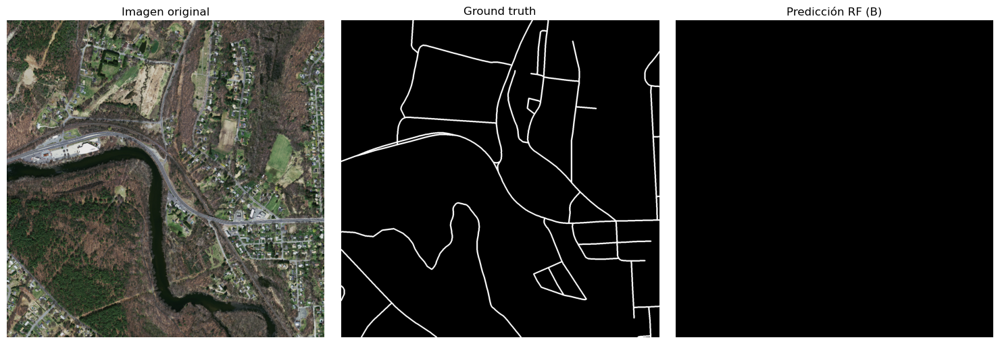

In [12]:
# RANDOM FOREST

rf_B = RandomForestClassifier(n_estimators= 10, max_depth= 5, min_samples_leaf=2, max_features= "sqrt", random_state=seed, n_jobs=-1, verbose=0)
    
# Lo entrenamos
rf_B, y_val_pred_rf_B, metrics_val_rf_B= train_and_evaluate_model(rf_B, X_train_B, y_train_B, X_val_B, y_val_B,model_name="RandomForest (B)")

# Guardamos los resultados y visualizamos 
guardar_resultado(resultadosB, "Random Forest (B)", rf_B, y_val_pred_rf_B, None, metrics_val_rf_B, None)
show_example_prediction(X_val, y_val, y_val_pred_rf_B, title="Predicción RF (B)")


=== TEST ===

Test:
Accuracy:0.9733
Precision:0.0000
Recall:0.0000
Jaccard:0.0000
Dice:0.0000


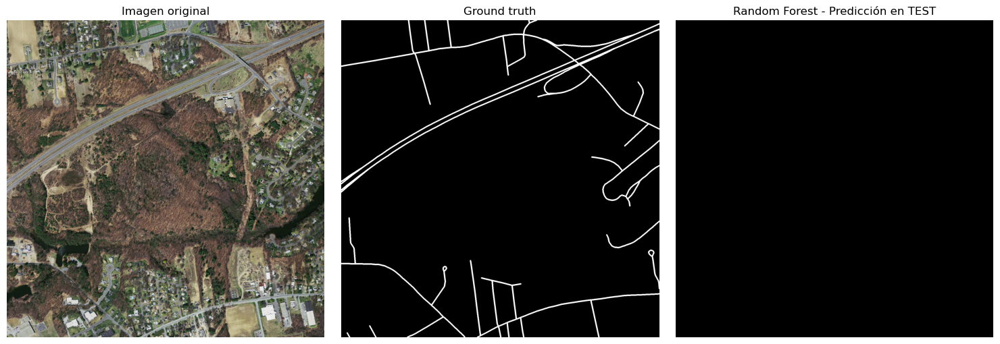

In [13]:
y_test_pred_rf_B, metrics_test_rf_B = evaluate_test(rf_B,X_test_B, y_test_B,model_name= rf_B)
show_example_prediction(X_test, y_test, y_test_pred_rf_B, title="Random Forest - Predicción en TEST") 

Observando las salidas, tanto en validación como en test, las predicciones se ven completamente negras, lo que significa que el modelo está asignando todos los píxeles como fondo. Este resultado se da porque no aplicamos ningún tipo de balanceo entre clases, hay muchos más píxeles de fondo que de carretera. Trabajando sobre el dataset de esa manera, el modelo aprende la solución más fácil que es siempre predecir la clase con más ejemplos, lo que explica por qué no detecta ninguna carretera en sus predicciones. 

### Aproximación 1: Encontrando el mejor balanceado

En la **Aproximación 1** queremos determinar el tamaño de *undersampling* óptimo. Para esto, probamos distintos valores reduciendo la clase mayoritaria y evaluamos cada uno usando un único modelo (en este caso Random Forest) para poder identificar la cantidad de píxeles que ofrece el mejor equilibrio entre rendimiento y coste computacional.

In [ ]:
X_train_A1, y_train_A1 = prepare_dataset(X_train, y_train, feature_type="raw")
print_dataset_info(X_train, y_train, X_train_A1, y_train_A1, "Train")

X_val_A1, y_val_A1 = prepare_dataset(X_val, y_val, feature_type="raw")
print_dataset_info(X_val, y_val, X_val_A1, y_val_A1, "Val")

X_test_A1, y_test_A1 = prepare_dataset(X_test, y_test, feature_type="raw")
print_dataset_info(X_test, y_test, X_test_A1, y_test_A1, "Test")

resultadosA1 = [] 


=== Train ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (36000000, 3) ; (36000000,)

=== Val ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (4500000, 3) ; (4500000,)

=== Test ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (4500000, 3) ; (4500000,)


In [ ]:
tamanos = [5000, 10000, 25000, 50000, 100000, 200000]

for n in tamanos:    
    # Undersampling con ese tamaño
    X_train_A1_bal, y_train_A1_bal = undersample(X_train_A1, y_train_A1, n_per_class=n, random_state=seed)
    
    rf = RandomForestClassifier(n_estimators= 80,max_depth= 18, min_samples_leaf=8, max_features= "sqrt", random_state=seed, n_jobs=-1, verbose=0)
    
    # Entrenar + validar
    rf, y_val_pred_rf, metrics_val_rf = train_and_evaluate_model(rf, X_train_A1_bal, y_train_A1_bal, X_val_A1, y_val_A1, model_name=f"Random Forest (A1, n={n})")

    # Guardar resultados para compararlos luego
    guardar_resultado(resultadosA1, f"Random Forest (A1, n={n})", rf, y_val_pred_rf, None, metrics_val_rf, None)
    # show_example_prediction(X_val, y_val, y_val_pred_rf, title=f"Predicción RF (A1, n={n})")



=== Random Forest (A1, n=5000): ENTRENAMIENTO ===
Entrenando con 10000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8185
Precision:0.2256
Recall:0.7828
Jaccard:0.2123
Dice:0.3502

=== Random Forest (A1, n=10000): ENTRENAMIENTO ===
Entrenando con 20000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8183
Precision:0.2258
Recall:0.7851
Jaccard:0.2126
Dice:0.3507

=== Random Forest (A1, n=25000): ENTRENAMIENTO ===
Entrenando con 50000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8243
Precision:0.2317
Recall:0.7822
Jaccard:0.2177
Dice:0.3575

=== Random Forest (A1, n=50000): ENTRENAMIENTO ===
Entrenando con 100000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8244
Precision:0.2322
Recall:0.7845
Jaccard:0.2183
Dice:0.3584

=== Random Forest (A1, n=100000): ENTRENAMIENTO ===
Entrenando con 200000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8244
Precision:0.2320

In [16]:
df_A1 = tabla_comparativa(resultadosA1, "Escenario A1: Encontrando el mejor balanceado")

Escenario A1: Encontrando el mejor balanceado


,Modelo,Val_Acc,Val_Prec,Val_Rec,Val_Jaccard,Val_Dice
5,"Random Forest (A1, n=200000)",0.825064,0.232724,0.783316,0.218648,0.358837
3,"Random Forest (A1, n=50000)",0.824425,0.232210,0.784518,0.218287,0.358351
4,"Random Forest (A1, n=100000)",0.824421,0.232031,0.783415,0.218044,0.358023
2,"Random Forest (A1, n=25000)",0.824296,0.231698,0.782185,0.217655,0.357498
1,"Random Forest (A1, n=10000)",0.818323,0.225773,0.785058,0.212629,0.350691
0,"Random Forest (A1, n=5000)",0.818478,0.225571,0.782761,0.212282,0.350219


Antes de hacer el análisis sobre las métricas, es importante mencionar que para este primer ejercicio nuestro criterio de evaluación es el índice de Dice porque mide directamente cuánto coinciden la predicción y el ground truth, siendo una métrica adecuada para los problemas de segmentación

Para esta prueba baseline, observando los resultados vemos que el valor de **Dice** mejora de forma constante desde *n* = 5000 hasta *n* = 50 000. A partir de ahí, usar más datos apenas aporta beneficios: los resultados de *n* = 100000 y *n* = 200000 son prácticamente iguales a las de 50000. Como aumentar tanto el tamaño del conjunto hace que el entrenamiento sea mucho más lento sin mejorar realmente el rendimiento, elegimos **n = 50 000 como la cantidad óptima**. 

### Aproximación 2: Probando diferentes modelos con el balanceado óptimo 

En la **Aproximación 2**, teniendo en cuenta el undersampling óptimo, lo aplicamos a varios modelos de clasificación para comparar su comportamiento bajo las mismas condiciones y seleccionar los dos que muestran mejores resultados.

In [ ]:
X_train_A2, y_train_A2 = prepare_dataset(X_train, y_train, feature_type="raw")
print_dataset_info(X_train, y_train, X_train_A2, y_train_A2, "Train original")
X_train_A2_bal, y_train_A2_bal = undersample(X_train_A2, y_train_A2, n_per_class= 50000, random_state=seed)
print("Train original:", X_train_A2.shape, " | Train balanceado:", X_train_A2_bal.shape)

X_val_A2, y_val_A2 = prepare_dataset(X_val, y_val, feature_type="raw")
print_dataset_info(X_val, y_val, X_val_A2, y_val_A2, "Val")

X_test_A2, y_test_A2 = prepare_dataset(X_test, y_test, feature_type="raw")
print_dataset_info(X_test, y_test, X_test_A2, y_test_A2, "Test")

resultadosA2 = [] # lista en la que almacenaremos los resultados de todos los modelos


=== Train original ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (36000000, 3) ; (36000000,)
Train original: (36000000, 3)  | Train balanceado: (100000, 3)

=== Val ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (4500000, 3) ; (4500000,)

=== Test ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (4500000, 3) ; (4500000,)



=== RandomForest (A2): ENTRENAMIENTO ===
Entrenando con 100000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8244
Precision:0.2322
Recall:0.7845
Jaccard:0.2183
Dice:0.3584


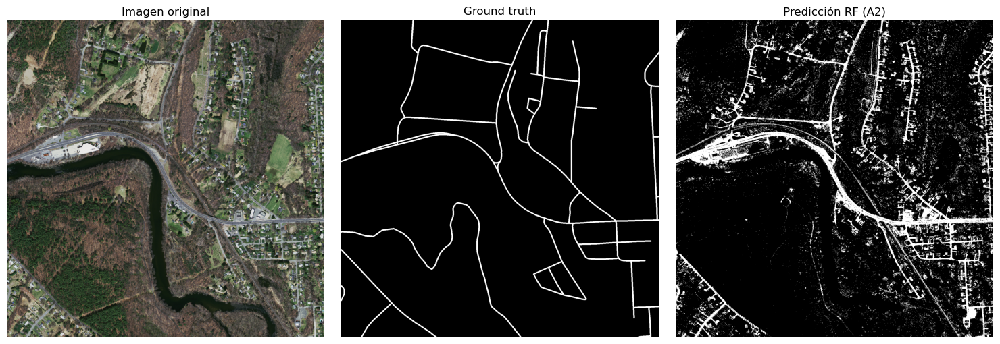

In [18]:
# RANDOM FOREST
# Definimos el modelo.
rf_A2 = RandomForestClassifier(n_estimators= 80,max_depth= 18, min_samples_leaf=8, max_features= "sqrt", random_state=seed, n_jobs=-1, verbose=0)
    
# Lo entrenamos
rf_A2, y_val_pred_rf_A2, metrics_val_rf_A2 = train_and_evaluate_model(rf_A2, X_train_A2_bal, y_train_A2_bal, X_val_A2, y_val_A2,model_name="RandomForest (A2)")

# Guardamos los resultados y visualizamos 
guardar_resultado(resultadosA2, "Random Forest (A2)", rf_A2, y_val_pred_rf_A2, None, metrics_val_rf_A2, None)
show_example_prediction(X_val, y_val, y_val_pred_rf_A2, title="Predicción RF (A2)")


=== LogisticRegression (A2): ENTRENAMIENTO ===
Entrenando con 100000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8259
Precision:0.2273
Recall:0.7441
Jaccard:0.2108
Dice:0.3482


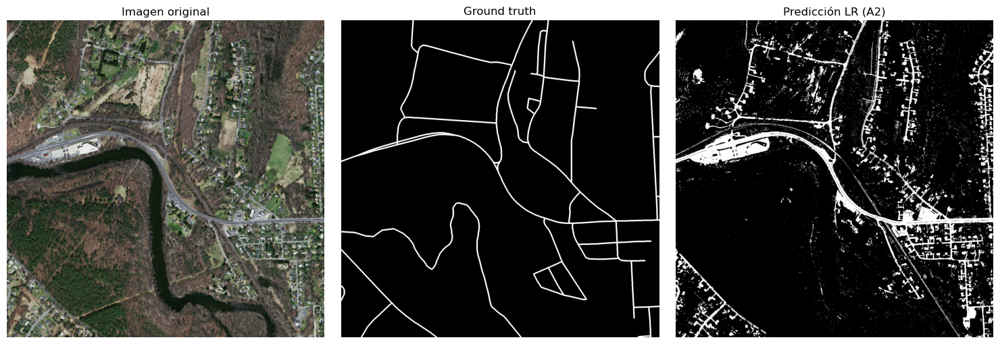

In [19]:
# LOGISTIC REGRESSION
lr_A2 = LogisticRegression(penalty="l2", C=1.0, solver="lbfgs", max_iter=200, n_jobs=-1)

lr_A2, y_val_pred_lr_A2, metrics_val_lr_A2 = train_and_evaluate_model(lr_A2, X_train_A2_bal, y_train_A2_bal, X_val_A2, y_val_A2,model_name="LogisticRegression (A2)")

guardar_resultado(resultadosA2, "Logistic Regression (A2)", lr_A2, y_val_pred_lr_A2, None, metrics_val_lr_A2, None)
show_example_prediction(X_val, y_val, y_val_pred_lr_A2, title="Predicción LR (A2)")


=== KNN (A2): ENTRENAMIENTO ===
Entrenando con 100000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8051
Precision:0.2072
Recall:0.7500
Jaccard:0.1938
Dice:0.3247


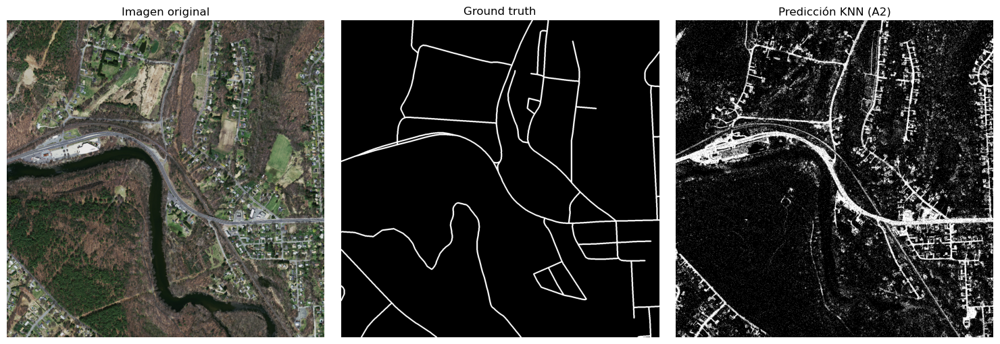

In [20]:
# K NEAREST NEIGHBOURS
knn_A2 = KNeighborsClassifier(n_neighbors= 10, weights="distance",n_jobs=-1)

knn_A2, y_val_pred_knn_A2, metrics_val_knn_A2 = train_and_evaluate_model(knn_A2, X_train_A2_bal, y_train_A2_bal, X_val_A2, y_val_A2, model_name="KNN (A2)")

guardar_resultado(resultadosA2, "KNN (A2)", knn_A2, y_val_pred_knn_A2, None, metrics_val_knn_A2, None)
show_example_prediction(X_val, y_val, y_val_pred_knn_A2, title="Predicción KNN (A2)")


===  Decision Tree (A2): ENTRENAMIENTO ===
Entrenando con 100000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8188
Precision:0.2231
Recall:0.7651
Jaccard:0.2088
Dice:0.3455


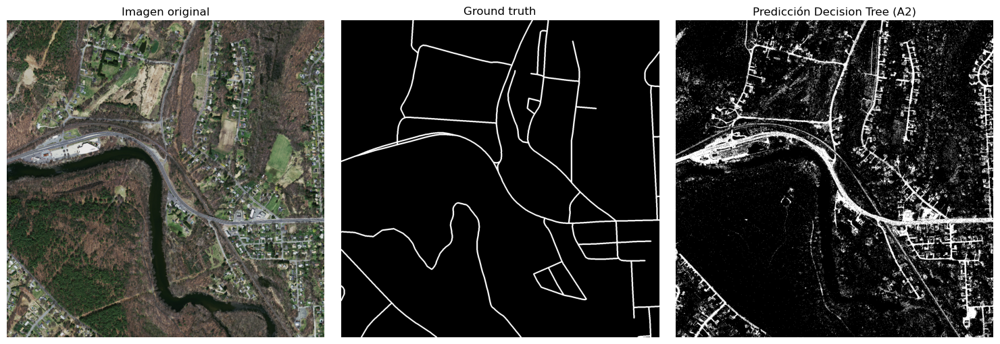

In [21]:
# DECISION TREE 
dt_A2 = DecisionTreeClassifier(max_depth=20, min_samples_leaf=10,  random_state=seed)

# Lo entrenamos 
dt_A2 , y_val_pred_dt_A2, metrics_val_dt_A2   = train_and_evaluate_model(dt_A2, X_train_A2_bal, y_train_A2_bal, X_val_A2, y_val_A2,model_name=" Decision Tree (A2)")
# Guardamos los resultados y visualizamos 
guardar_resultado(resultadosA2, "Decision Tree (A2)", dt_A2 , y_val_pred_dt_A2 , None , metrics_val_dt_A2 , None)
show_example_prediction(X_val, y_val, y_val_pred_dt_A2, title="Predicción Decision Tree (A2)")


=== SVM lineal (A2): ENTRENAMIENTO ===
Entrenando con 100000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8289
Precision:0.2294
Recall:0.7367
Jaccard:0.2120
Dice:0.3499


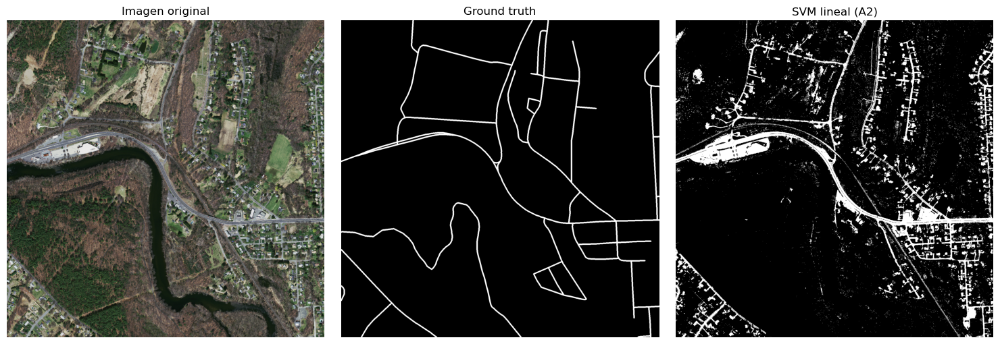

In [22]:
# SVM
svm_A2 = LinearSVC(C=1, max_iter=2000, random_state=seed)

# Lo entrenamos 
svm_A2, y_val_pred_svm_A2, metrics_val_svm_A2 = train_and_evaluate_model(svm_A2, X_train_A2_bal, y_train_A2_bal, X_val_A2, y_val_A2, model_name="SVM lineal (A2)")

# Guardamos los resultados y visualizamos 
guardar_resultado(resultadosA2, "SVM lineal (A2)", svm_A2, y_val_pred_svm_A2, None, metrics_val_svm_A2, None)
show_example_prediction(X_val, y_val, y_val_pred_svm_A2, title="SVM lineal (A2)")

In [23]:
df_A2 = tabla_comparativa(resultadosA2, "Escenario A2: Imágenes balanceadas")

Escenario A2: Imágenes balanceadas


,Modelo,Val_Acc,Val_Prec,Val_Rec,Val_Jaccard,Val_Dice
0,Random Forest (A2),0.824425,0.232210,0.784518,0.218287,0.358351
4,SVM lineal (A2),0.828892,0.229401,0.736681,0.212016,0.349857
1,Logistic Regression (A2),0.825895,0.227270,0.744119,0.210796,0.348194
3,Decision Tree (A2),0.818813,0.223099,0.765110,0.208798,0.345464
2,KNN (A2),0.805061,0.207216,0.749958,0.193825,0.324712


Observando las predicciones de los modelos, vemos que trabajar solamente con el undersampling, sin aplicar todavía la extracción de características, produce segmentaciones con bastante ruido y poca definición. En general, los modelos detectan la mayoría de las carreteras, pero también marcan otras zonas de la imagen como casas o vegetación, lo que provoca muchas falsas detecciones. 

En cuanto a la tabla comparativa, las métricas reflejan esas salidas. Aunque el recall es moderado para todos los modelos, la precision y, por tanto, los valores de Jaccard y Dice, son algo bajos. Esto indica que, aunque los modelos consiguen encontrar parte de las carreteras, también detectan muchos píxeles incorrectos en sus predicciones. 

Con esta aproximación podemos decir que el balanceo de clases mejora respecto al baseline, pero no es suficiente para conseguir muy buenas segmentaciones. Para poder acercarnos un poco más al ground truth, aplicaremos la extracción de características sobre los mejores modelos de esta aproximación.

Ahora vamos a ver cómo funcionan los dos mejores modelos (RandomForest y SVM) sobre el conjunto de test. 


=== TEST ===

Test:
Accuracy:0.8304
Precision:0.1196
Recall:0.8419
Jaccard:0.1170
Dice:0.2095


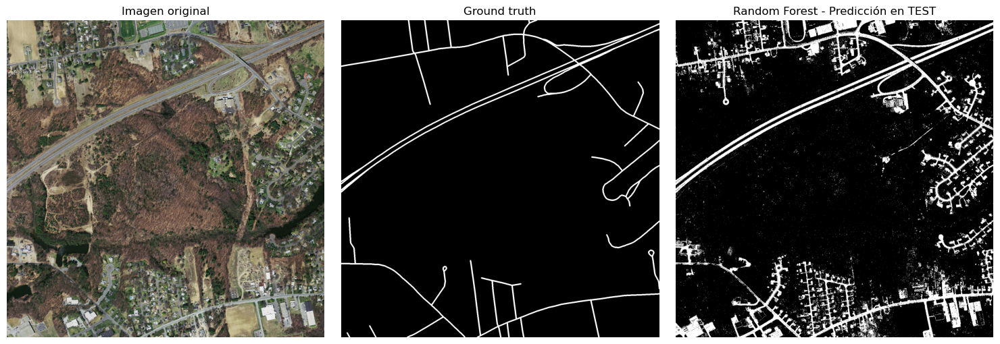

In [24]:
y_test_pred_rf_A2, metrics_test_rf_A2 = evaluate_test(rf_A2,X_test_A2, y_test_A2,model_name= rf_A2)
show_example_prediction(X_test, y_test, y_test_pred_rf_A2, title="Random Forest - Predicción en TEST") 


=== TEST ===

Test:
Accuracy:0.8308
Precision:0.1149
Recall:0.7956
Jaccard:0.1116
Dice:0.2008


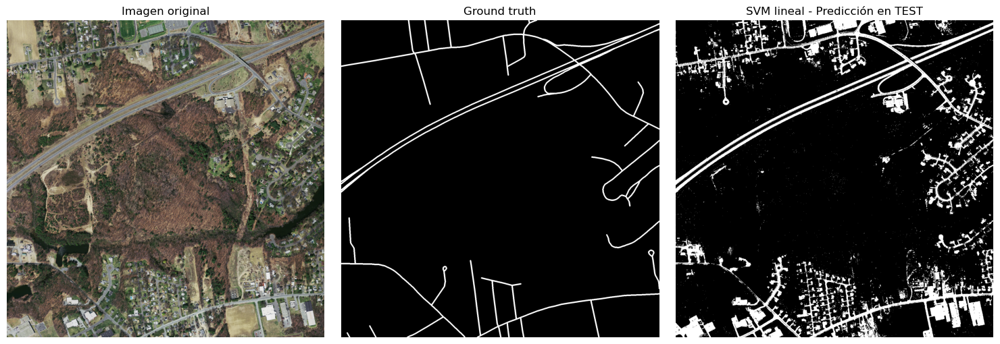

In [25]:
y_test_pred_svm_A2, metrics_test_svm_A2 = evaluate_test(svm_A2, X_test_A2, y_test_A2, model_name= svm_A2)
show_example_prediction(X_test, y_test, y_test_pred_svm_A2, title="SVM lineal - Predicción en TEST")

Con las predicciones de Random Forest y SVM sobre el conjunto de test, observamos que ambos modelos alcanzan una buena capacidad para identificar píxeles positivos (recall alto), pero muestran dificultades para evitar falsas detecciones, lo que se refleja en una precisión baja y en máscaras con ruido. 

Visualmente, los dos clasificadores son capaces de recuperar la estructura general de las carreteras principales, aunque también detectan algunas casas y zonas con texturra similar, igual que en el conjunto de validación. 

### Aproximación 3: Balanceado + Extracción de Características 

En la **Aproximación 3**, combinamos el undersampling óptimo con la extracción de características definida en la función `extract_all_featrures`, entrenando de nuevo los dos modelos seleccionados en la etapa anterior.

In [ ]:
X_train_A3, y_train_A3 = prepare_dataset(X_train, y_train, feature_type="feat")
print_dataset_info(X_train, y_train, X_train_A3, y_train_A3, "Train orininal")
X_train_A3_bal, y_train_A3_bal = undersample(X_train_A3, y_train_A3, n_per_class= 50000, random_state=seed)
print("Train original:", X_train_A3.shape, " | Train balanceado:", X_train_A3_bal.shape)

X_val_A3, y_val_A3 = prepare_dataset(X_val, y_val, feature_type="feat")
print_dataset_info(X_val, y_val, X_val_A3, y_val_A3, "Val")

X_test_A3, y_test_A3 = prepare_dataset(X_test, y_test, feature_type="feat")
print_dataset_info(X_test, y_test, X_test_A3, y_test_A3, "Test")

resultadosA3 = [] 


=== Train orininal ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (36000000, 20) ; (36000000,)
Train original: (36000000, 20)  | Train balanceado: (100000, 20)

=== Val ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (4500000, 20) ; (4500000,)

=== Test ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (4500000, 20) ; (4500000,)



=== RandomForest (A3): ENTRENAMIENTO ===
Entrenando con 100000 píxeles...


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.6s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.


Modelo entrenado

=== VALIDACIÓN ===


[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    1.3s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    5.7s finished



Validación:
Accuracy:0.8458
Precision:0.2621
Recall:0.8079
Jaccard:0.2467
Dice:0.3958


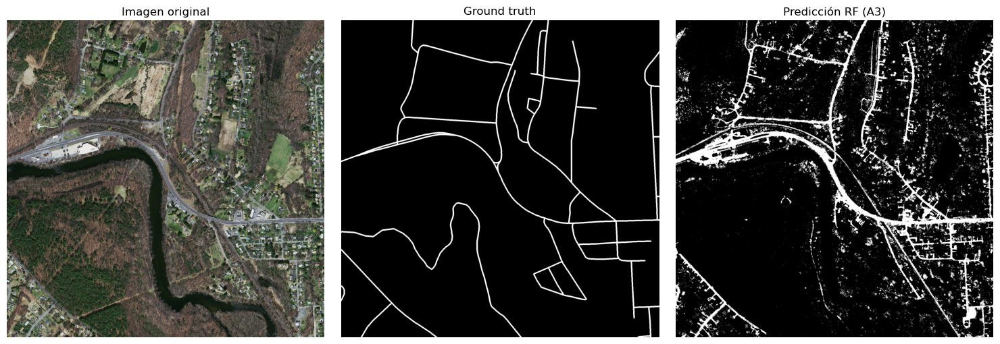

In [27]:
# RANDOM FOREST
# Definimos el modelo.
rf_A3 =  RandomForestClassifier(n_estimators=100, max_depth=20,min_samples_leaf=5,n_jobs=-1, random_state=seed,verbose=1)

# Lo entrenamos 
rf_A3, y_val_pred_rf_A3, metrics_val_rf_A3 = train_and_evaluate_model(rf_A3, X_train_A3_bal, y_train_A3_bal, X_val_A3, y_val_A3, model_name="RandomForest (A3)")

# Guardamos los resultados y visualizamos 
guardar_resultado(resultadosA3, "Random Forest (A3)", rf_A3, y_val_pred_rf_A3, None, metrics_val_rf_A3, None)
show_example_prediction(X_val, y_val, y_val_pred_rf_A3, title="Predicción RF (A3)")


=== SVM lineal(A3): ENTRENAMIENTO ===
Entrenando con 100000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8055
Precision:0.2136
Recall:0.7875
Jaccard:0.2019
Dice:0.3360


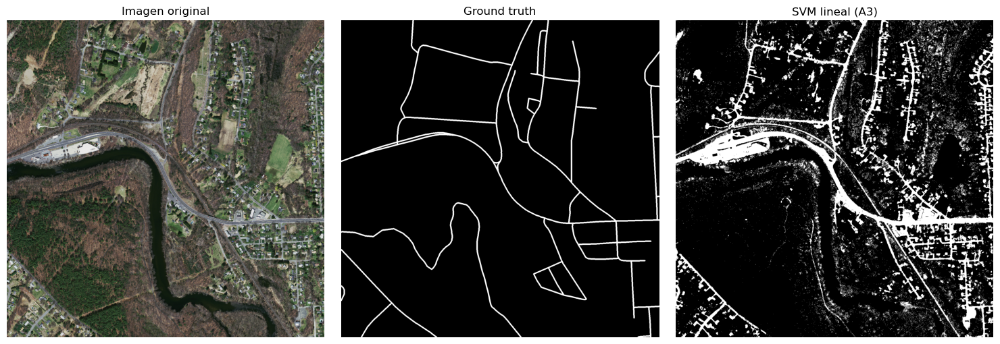

In [28]:
svm_A3 = LinearSVC(C=1, max_iter=2000, random_state=seed)

# Lo entrenamos 
svm_A3, y_val_pred_svm_A3, metrics_val_svm_A3 = train_and_evaluate_model(svm_A3, X_train_A3_bal, y_train_A3_bal, X_val_A3, y_val_A3, model_name="SVM lineal(A3)")

# Guardamos los resultados y visualizamos 
guardar_resultado(resultadosA3, "SVM lineal (A3)", svm_A3, y_val_pred_svm_A3, None, metrics_val_svm_A3, None)
show_example_prediction(X_val, y_val, y_val_pred_svm_A3, title="SVM lineal (A3)")

In [29]:
df_A3 = tabla_comparativa(resultadosA3, "Escenario A3: Imágenes balanceadas + extracción de características")

Escenario A3: Imágenes balanceadas + extracción de características


,Modelo,Val_Acc,Val_Prec,Val_Rec,Val_Jaccard,Val_Dice
0,Random Forest (A3),0.845845,0.262089,0.807880,0.246712,0.395780
1,SVM lineal (A3),0.805496,0.213569,0.787498,0.201931,0.336011


Viendo las predicciones de esta aproximación, vemos que incorporar las nuevas características junto con el undersampling mejora la definición de las carreteras. Aun así, siguen apareciendo zonas ruidosas y ciertas estructuras que no corresponden con la carretera real.

Observando la tabla y, basándonos en el índice de Dice, vemos que la extracción de características mejora los resultados en el caso de Random Forest, que pasa de un Dice de 0.358 en A2 a 0.396 en la A3. Sin embargo, el comportamiento del SVM es distinto ya que su Dice disminuye un poco de 0.349 a 0.336. 

Creemos que este resultado tiene sentido por la forma en la que funcionan los modelos. El SVM lineal suele funcionar bien cuando los datos son fáciles de separar y no contienen demasiado ruido. En este ejercicio, aunque añadimos más características, el problema sigue siendo complejo y la separación entre carretera y fondo no es tan clara. Por eso el modelo no aprovecha esta información extra y su rendimiento incluso baja un poco. En cambio, Random Forest sí aprovecha esta información adicional, porque sus árboles pueden capturar relaciones no lineales entre las nuevas características. 

Dado que el SVM no muestra una mejora en esta aproximación, emplearemos ahora nuetro mejor modelo hasta el momento: Random Forest. 
Ahora vamos a ver su comportamiento sobre el conjunto de test.


=== TEST ===


[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    1.1s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    5.4s finished



Test:
Accuracy:0.8466
Precision:0.1328
Recall:0.8583
Jaccard:0.1300
Dice:0.2300


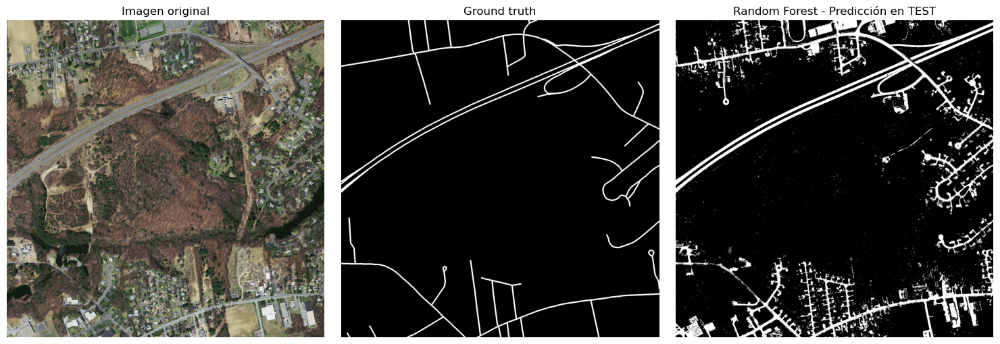

In [30]:
y_test_pred_rf_A3, metrics_test_rf_A3 = evaluate_test(rf_A3, X_test_A3, y_test_A3, model_name= rf_A3)
show_example_prediction(X_test, y_test, y_test_pred_rf_A3, title="Random Forest - Predicción en TEST") 

El Random Forest en esta aproximación muestra una mejora respecto a las versiones anteriores, sobre todo en métricas como el recall y el índice de Dice. El modelo es capaz de identificar una gran parte de píxeles correspondientes a carretera. Sin embargo, la precisión sigue siendo baja y la máscara resultante contiene bastante ruido, especialmente en las zonas donde hay casas o mucha textura. Aun así, las carreteras principales aparecen mejor definidas y más continuas. 

Ahora, sobre estos resultados tenemos que aplicar postprocesado para eliminar falsas detecciones e intentar obtener una máscara más limpia.

### Aproximación 4: Postprocesado

En esta **Aproximación 4**  partimos del mejor modelo obtenido en la aproximación anterior (el Random Forest entrenado con características) y aplicamos un **postprocesado morfológico** sobre las máscaras predichas. El objetivo es eliminar ruído y ellenar huecos y pequeñas discontinuidades en las carreteras.

Para ello:

1. Reconstruimos las máscaras 2D a partir de las predicciones aplanadas del modelo.
2. Aplicamos sobre cada máscara operaciones morfológicas (eliminación de objetos pequeños, eliminación de pequeños agujeros, opening y closing).
- **Opening (apertura)**: erosión seguida de dilatación. Tiende a eliminar regiones pequeñas y delgadas, por lo que nos ayuda a limpiar puntos sueltos o manchas muy pequeñas de carretera que en realidad son ruido.
- **Closing (clausura)**: dilatación seguida de erosión. Tiende a rellenar pequeños huecos dentro de las regiones positivas y a cerrar cortes finos, lo que resulta útil para hacer que las carreteras sean más continuas.
3. Volvemos a aplanar las máscaras postprocesadas para poder calcular las métricas con el mismo formato que en las aproximaciones anteriores.

Después de probar varias configuraciones y comparar sus efectos tanto a nivel visual como en las métricas de validación, hemos obtenido los mejores resultados con la siguiente versión de `postprocesar_mascara`:

In [31]:
def postprocesar_mascara(mascara_pred):
    m = mascara_pred.astype(bool)

    m = binary_opening(m, disk(1))  # Opening suave para eliminar pequeños puntos de ruido sin erosionar carreteras finas.
    m = binary_closing(m, disk(1)) # Closing ligero para conectar tramos de carretera cercanos sin engrosar demasiado las líneas.
    m = remove_small_objects(m, min_size=200) # Valor elegido como equilibrio entre limpieza y no borrar ramales.
    m = binary_opening(m, disk(1)) # Suavizado final ligero para eliminar restos de artefactos después del filtrado.

    return m.astype(np.uint8)


def postprocesar_predicciones_aplanadas(y_pred_flat, y_imgs):
    n, h, w = y_imgs.shape
    y_pred_img = y_pred_flat.reshape(n, h, w)

    y_pred_pp_img = np.zeros_like(y_pred_img, dtype=np.uint8)
    for i in range(n):
        y_pred_pp_img[i] = postprocesar_mascara(y_pred_img[i])

    return y_pred_pp_img.reshape(-1)



[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    1.2s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    5.3s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    1.2s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    5.1s finished


=== VALIDACIÓN (antes del postprocesado) ===

RF (A3) sin postprocesado:
Accuracy:0.8458
Precision:0.2621
Recall:0.8079
Jaccard:0.2467
Dice:0.3958

=== TEST (antes del postprocesado) ===

RF (A3) sin postprocesado:
Accuracy:0.8466
Precision:0.1328
Recall:0.8583
Jaccard:0.1300
Dice:0.2300

=== VALIDACIÓN (después del postprocesado) ===

RF (A3) + postprocesado:
Accuracy:0.8965
Precision:0.3527
Recall:0.7864
Jaccard:0.3219
Dice:0.4870

=== TEST (después del postprocesado) ===

RF (A3) + postprocesado:
Accuracy:0.8672
Precision:0.1488
Recall:0.8417
Jaccard:0.1448
Dice:0.2529


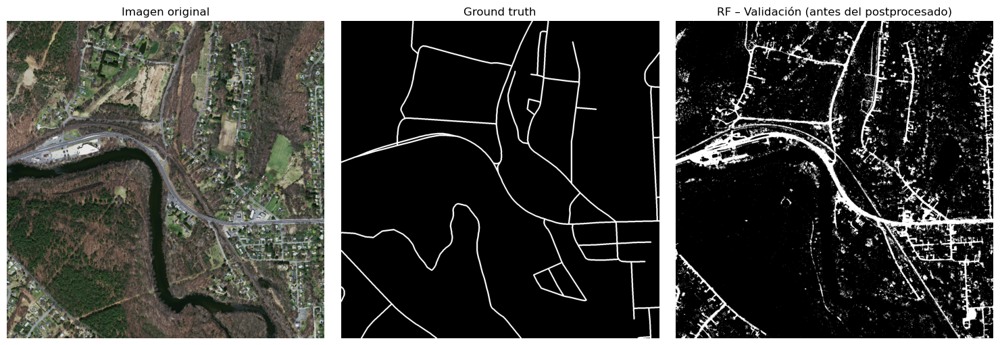

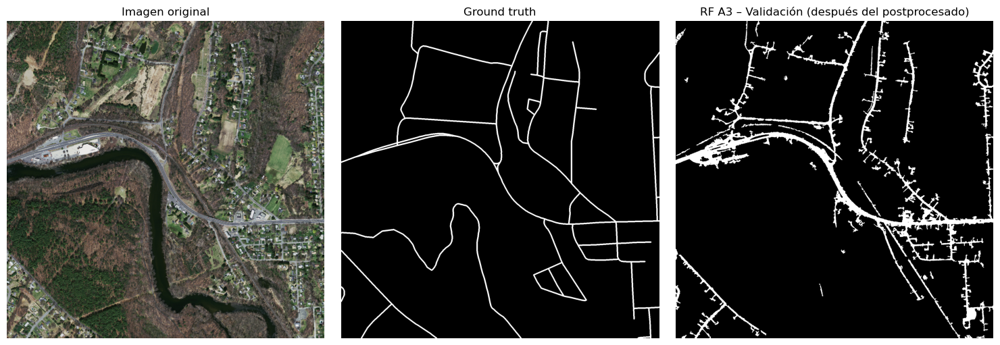

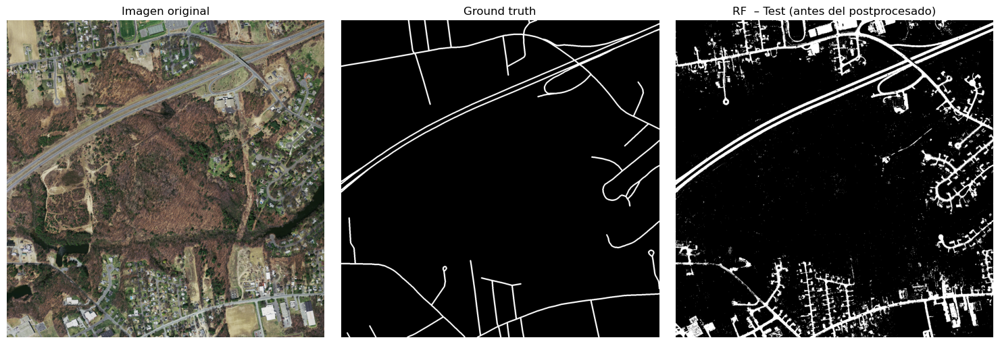

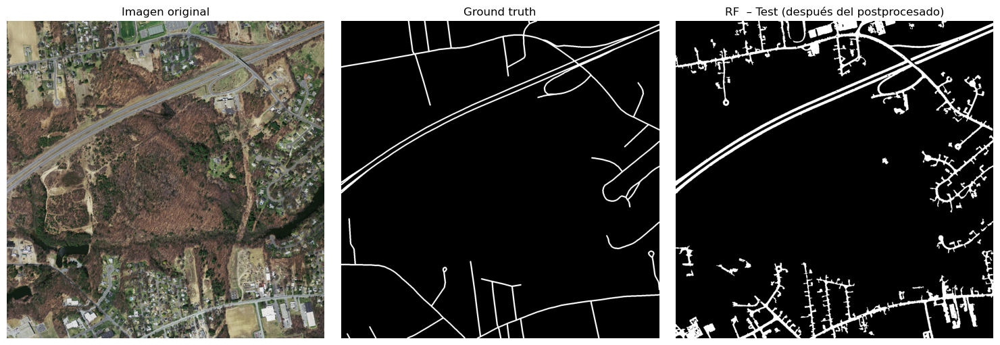

In [32]:
# Partimos del mejor modelo de la Aproximación 3: rf_A3 entrenado sobre X_train_A3_bal

# 1) Predicciones originales (sin postprocesado)
y_val_pred_rf_A3  = rf_A3.predict(X_val_A3)
y_test_pred_rf_A3 = rf_A3.predict(X_test_A3)

print("=== VALIDACIÓN (antes del postprocesado) ===")
metrics_val_rf_A3 = metrics(y_val_A3, y_val_pred_rf_A3, name="RF (A3) sin postprocesado")

print("\n=== TEST (antes del postprocesado) ===")
metrics_test_rf_A3 = metrics(y_test_A3, y_test_pred_rf_A3, name="RF (A3) sin postprocesado")

# 2) Aplicamos el postprocesado morfológico sobre las máscaras predichas
y_val_pred_rf_A3_pp = postprocesar_predicciones_aplanadas(y_val_pred_rf_A3, y_val)
y_test_pred_rf_A3_pp = postprocesar_predicciones_aplanadas(y_test_pred_rf_A3, y_test)

print("\n=== VALIDACIÓN (después del postprocesado) ===")
metrics_val_rf_A4 = metrics(y_val_A3, y_val_pred_rf_A3_pp, name="RF (A3) + postprocesado")

print("\n=== TEST (después del postprocesado) ===")
metrics_test_rf_A4 = metrics(y_test_A3, y_test_pred_rf_A3_pp, name="RF (A3) + postprocesado")

# 3) Visualizamos un ejemplo antes / después en validación y en test 
show_example_prediction(X_val, y_val, y_val_pred_rf_A3, title="RF – Validación (antes del postprocesado)")
show_example_prediction(X_val, y_val, y_val_pred_rf_A3_pp,title="RF A3 – Validación (después del postprocesado)")
show_example_prediction(X_test,y_test,y_test_pred_rf_A3,title="RF  – Test (antes del postprocesado)")
show_example_prediction(X_test,y_test,y_test_pred_rf_A3_pp,title="RF  – Test (después del postprocesado)")

# Guardamos los resultados de esta aproximación 4
# Esto lo usamos solo para la comparación global
resultadosA4 = []
guardar_resultado(resultadosA4, "Random Forest (A4)", rf_A3,y_val_pred_rf_A3_pp, y_test_pred_rf_A3_pp, metrics_val_rf_A4, metrics_test_rf_A4,)

Después de aplicar el postprocesado, las segmentaciones se ven más limpias que en la salida original. Muchas de las detecciones aisladas desaparecen y las carreteras principales quedan más definidas, aunque todavía aparecen algunas zonas que no forman parte de las vías. Aun así, la máscara final resulta mejor que las anteirores.

En cuanto al rendimiento, el valor de Dice pasa de 0.3958 a 0.4870 en validación, mostrando una mejora clara. En test la subida es menor, pero también positiva. Esto indica que el postprocesado ayuda a mejorar el solapamiento entre la predicción y el ground truth.

### Tabla comparativa global

In [33]:
baseline = mejor_modelo(resultadosB)
best_A1 = resultadosA1[3]  # Los resultados de A1 y A2 son lo mismo 
best_A2 = mejor_modelo(resultadosA2)
best_A3 = mejor_modelo(resultadosA3)
best_A4 = mejor_modelo(resultadosA4)

resultados_global = [baseline, best_A1, best_A2, best_A3, best_A4]

df_global = tabla_comparativa(
    resultados_global,
    "Comparación de escenarios (mejor modelo de cada aproximación)",
)


Comparación de escenarios (mejor modelo de cada aproximación)


,Modelo,Val_Acc,Val_Prec,Val_Rec,Val_Jaccard,Val_Dice
4,Random Forest (A4),0.896456,0.352706,0.786445,0.321878,0.487001
3,Random Forest (A3),0.845845,0.262089,0.807880,0.246712,0.395780
1,"Random Forest (A1, n=50000)",0.824425,0.232210,0.784518,0.218287,0.358351
2,Random Forest (A2),0.824425,0.232210,0.784518,0.218287,0.358351
0,Random Forest (B),0.937506,0.000000,0.000000,0.000000,0.000000


Con esta tabla comparativa global, podemos observar la  mejora progresiva que hemos conseguido a medida que avanzamos por las distintas aproximaciones. El baseline no consigue segmentar nada, mientras que la introducción del balanceo ya permite obtener valores de Dice. La extracción de características supone una mejora, y el postprocesado termina siendo la etapa que ofrece el mejor resultado global. En conjunto, el mejor rendimiento lo alcanza la Aproximación 4, lo que confirma que combinar un modelo bien entrenado con un filtrado final adecuado permite obtener mejores segmentaciones y con mayor solapamiento respecto al ground truth.